## Capstone Solution Part 2 - EDA, Technical Analysis and Recommendations

In [ ]:
##Load the libraries and the datasets created in Part 1

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go


In [ ]:
import chart_studio.plotly as py

In [ ]:
import plotly.graph_objects as go

In [ ]:
tech_df = pd.read_csv("tech.csv")

In [ ]:
fin_df = pd.read_csv("fin.csv")

In [ ]:
avn_df = pd.read_csv("avn.csv")

In [ ]:
pharma_df = pd.read_csv("phar.csv")

In [ ]:
tech_df.head()

,Date,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_fb
0,2015-01-04,31.062500,370.260010,541.074463,159.179993,40.720001,81.669998
1,2015-01-05,32.237499,422.869995,537.900024,173.669998,48.660000,78.989998
2,2015-01-06,32.634998,430.920013,533.989990,170.179993,47.230000,80.290001
3,2015-01-07,31.650000,437.390015,521.840027,164.490005,44.450001,86.910004
4,2015-01-09,26.930000,496.540009,597.789978,142.679993,41.820000,87.230003


In [ ]:
pharma_df.head()

,Date,Close_bhc,Close_jnj,Close_mrk,Close_pfe,Close_rhhby,Close_unh
0,2015-01-04,197.389999,99.150002,56.860001,34.330002,34.549999,117.449997
1,2015-01-05,223.020004,100.129997,59.860001,34.080002,36.040001,113.199997
2,2015-01-06,239.360001,100.040001,60.750000,34.560001,37.000000,119.860001
3,2015-01-07,228.240005,98.470001,57.599998,33.689999,35.139999,123.379997
4,2015-01-09,224.050003,92.089996,52.529999,31.360001,33.369999,112.629997


In [ ]:
pharma_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1429 entries, 0 to 1428
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         1429 non-null   object 
 1   Close_bhc    1429 non-null   float64
 2   Close_jnj    1429 non-null   float64
 3   Close_mrk    1429 non-null   float64
 4   Close_pfe    1429 non-null   float64
 5   Close_rhhby  1429 non-null   float64
 6   Close_unh    1429 non-null   float64
dtypes: float64(6), object(1)
memory usage: 78.3+ KB


In [ ]:
avn_df['Date'] = pd.to_datetime(avn_df['Date'], errors = 'coerce')

In [ ]:
fig = go.Figure(go.Scatter(
    x = list(avn_df['Date']),
    y = list(avn_df['Close_aal'])
))
fig.show()

In [ ]:
avn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1429 entries, 0 to 1428
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Date        1429 non-null   datetime64[ns]
 1   Close_aal   1429 non-null   float64       
 2   Close_algt  1429 non-null   float64       
 3   Close_alk   1429 non-null   float64       
 4   Close_dal   1429 non-null   float64       
 5   Close_ha    1429 non-null   float64       
 6   Close_luv   1429 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 78.3 KB


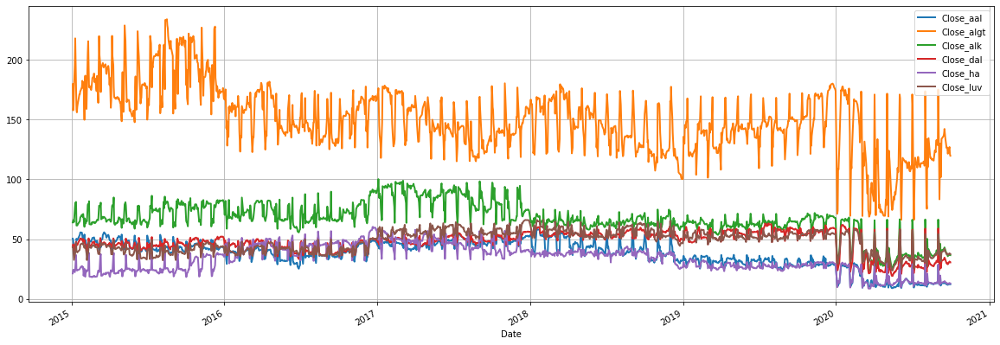

In [ ]:
avn_df.plot(x = 'Date', figsize = (20,7), linewidth = 2)
plt.grid()
plt.show()

## Interactive visualizations –Normalized stock prices and Not Normalized stock prices

In [ ]:
# Define a function to plot the entire dataframe
# The function takes in a dataframe df as an input argument and will not return any value
# The function performs data visualization for us

def show_plot(df, fig_title):
  df.plot(x = 'Date', figsize = (15,8), linewidth = 2, title = fig_title)
  plt.grid()
  plt.show()

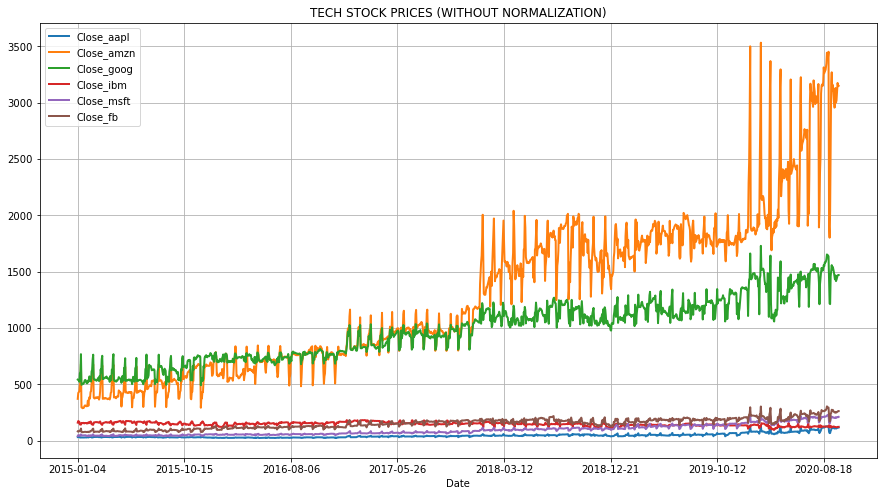

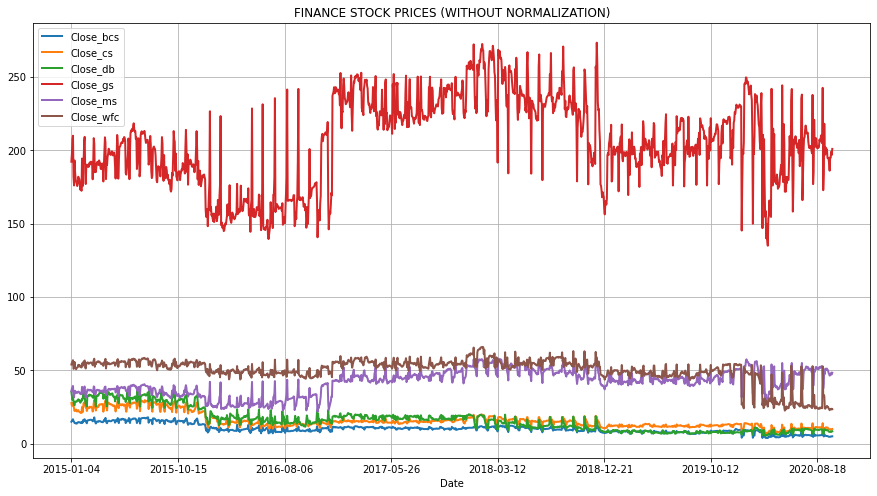

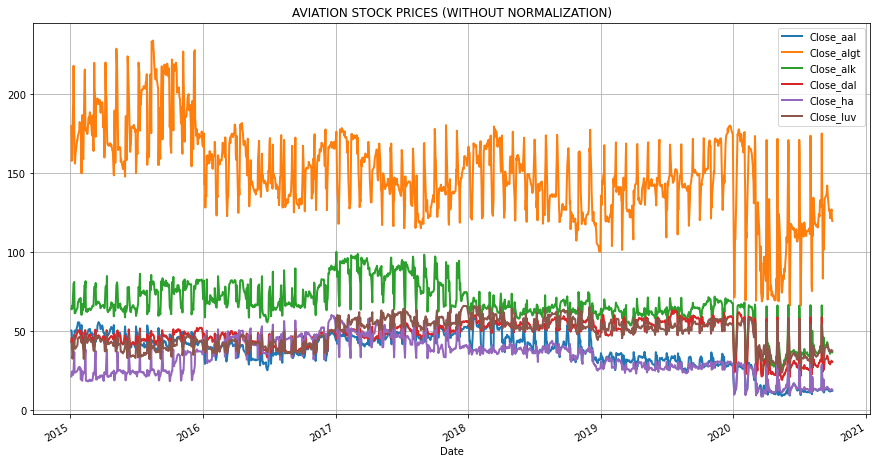

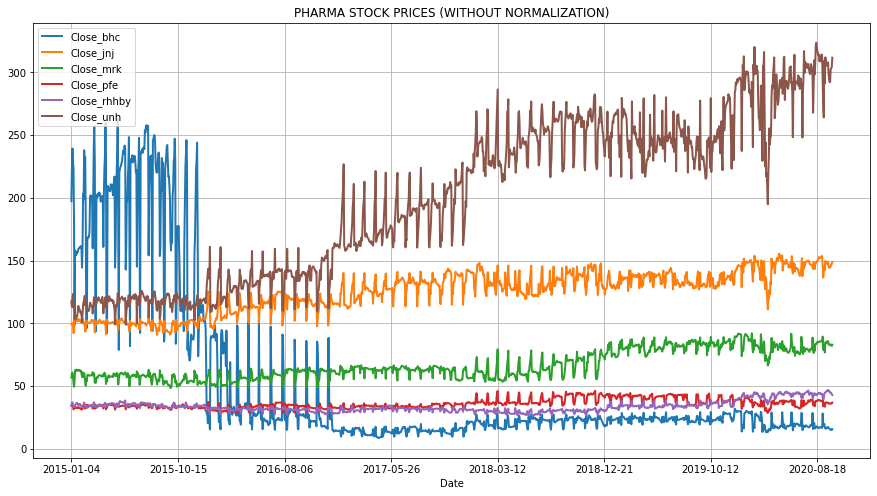

In [ ]:
# Plotting the non-normalized data
show_plot(tech_df, 'TECH STOCK PRICES (WITHOUT NORMALIZATION)')
show_plot(fin_df, 'FINANCE STOCK PRICES (WITHOUT NORMALIZATION)')
show_plot(avn_df, 'AVIATION STOCK PRICES (WITHOUT NORMALIZATION)')
show_plot(pharma_df, 'PHARMA STOCK PRICES (WITHOUT NORMALIZATION)')

In [ ]:
# Function to perform an interactive data plotting using plotly express
# Plotly.express module which is imported as px includes functions that can plot interactive plots easily and effectively. 
# Every Plotly Express function uses graph objects internally and returns a plotly.graph_objects. Looking at the figure we can understand the functionality. 

def interactive_plot(df, title):
  fig = px.line(title = title)
  
  # For Loop through each stock (while ignoring date column with index 0)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

  fig.show()

In [ ]:
# Plotting interactive chart
interactive_plot(avn_df, 'Closing Prices of stocks without normalization')
interactive_plot(tech_df, 'Closing Prices of stocks without normalization')
interactive_plot(fin_df, 'Closing Prices of stocks without normalization')
interactive_plot(pharma_df, 'Closing Prices of stocks without normalization')

In [ ]:
# Function to normalize the prices based on the initial price ie for Normalization
# The function simply divides every stock by it's price at the start date (i.e.: Date = 2010-01-10)	
def normalize(df):
  x = df.copy()

  # For Loop through each stock (while ignoring the date column with index 0)
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

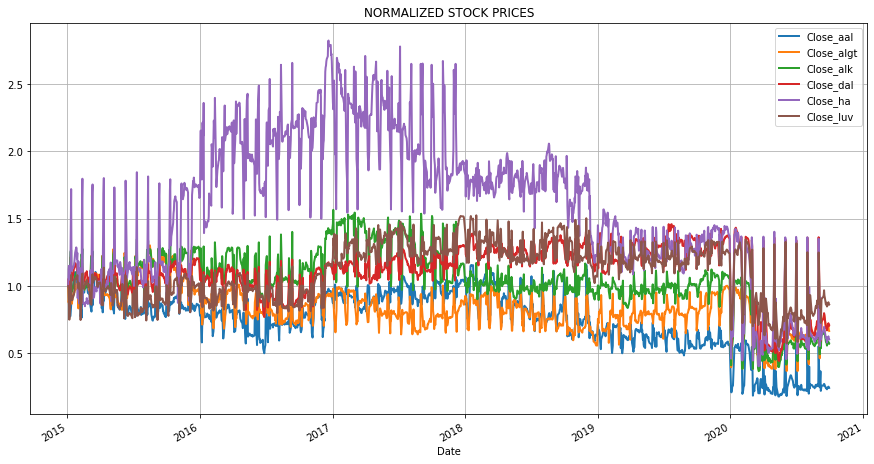

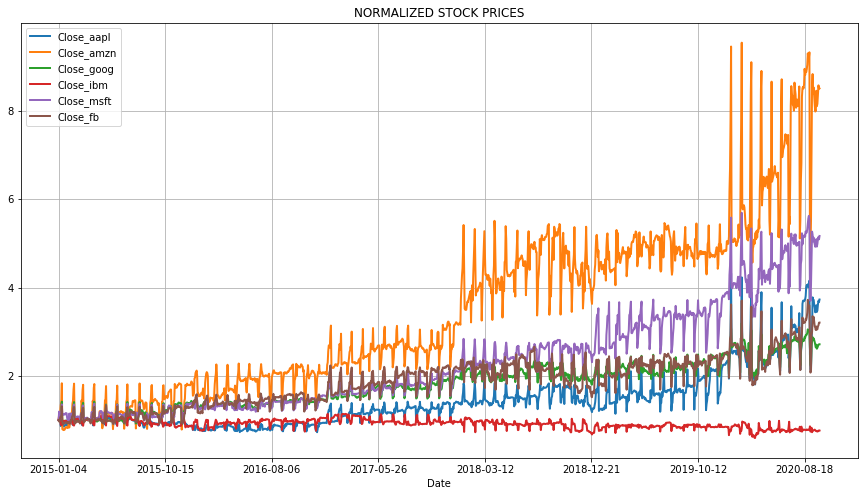

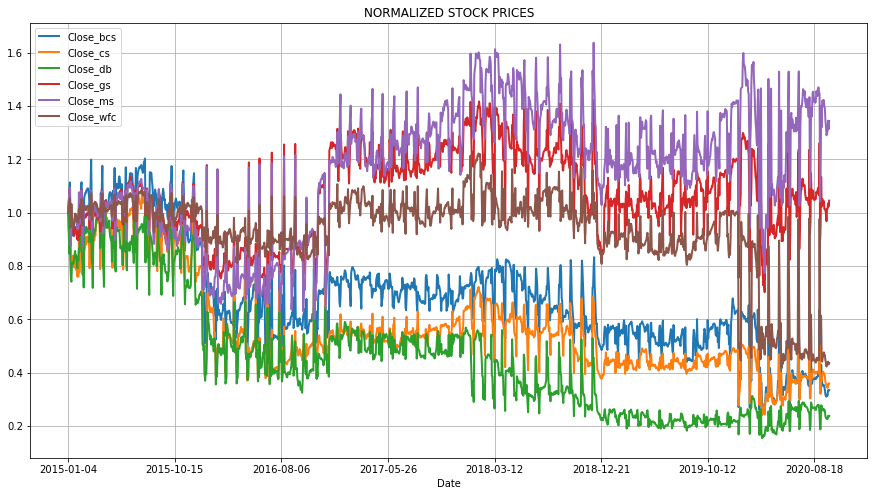

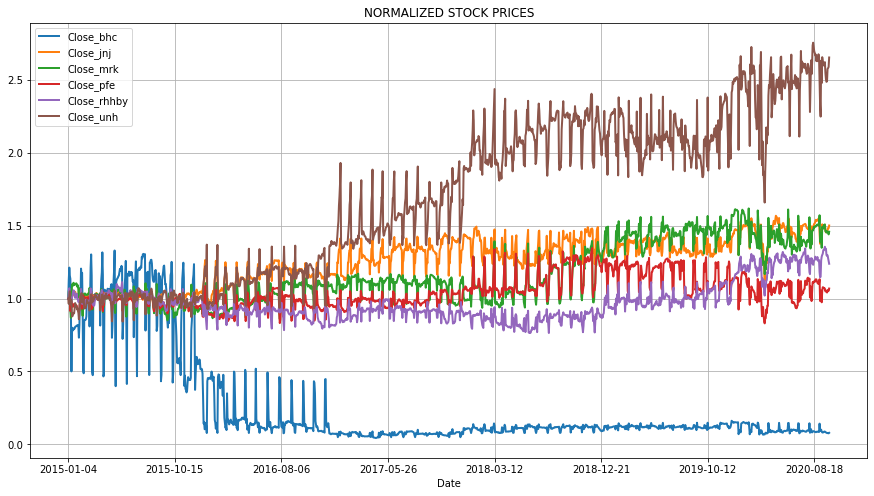

In [ ]:
# Plotting normalized data
show_plot(normalize(avn_df), 'NORMALIZED STOCK PRICES')
show_plot(normalize(tech_df), 'NORMALIZED STOCK PRICES')
show_plot(normalize(fin_df), 'NORMALIZED STOCK PRICES')
show_plot(normalize(pharma_df), 'NORMALIZED STOCK PRICES')

## Technical Analysis + EDA

In [ ]:
# Step 1 - Using Descriptive Statistics 
fin_df.describe()

,Close_bcs,Close_cs,Close_db,Close_gs,Close_ms,Close_wfc
count,1429.000000,1429.000000,1429.000000,1429.000000,1429.000000,1429.000000
mean,10.218796,15.754549,16.023135,205.898209,41.824381,50.030749
std,3.016633,5.101305,7.876714,30.106969,8.344852,8.557032
min,3.840000,6.670000,5.480000,134.970001,21.690001,22.530001
25%,8.420000,12.290000,9.160000,184.559998,36.060001,47.970001
50%,9.900000,14.610000,14.790000,206.000000,42.840000,52.299999
75%,11.380000,16.790001,19.030001,228.929993,48.150002,55.080002
max,17.980000,29.690001,36.060001,273.380005,58.910000,65.930000


`GS` has a significantly higher average stock value as compared to other stocks. However its standard deviation is also pretty high is a vital observation.

# Step 1 - Descriptive Statistics 
fin_snp.describe()

In [ ]:

avn_df.describe()

,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv
count,1429.000000,1429.000000,1429.000000,1429.000000,1429.000000,1429.000000
mean,37.863660,150.303212,67.355815,47.934800,33.866403,48.363926
std,11.114513,27.911914,14.309668,8.705538,11.314979,8.906546
min,9.040000,66.230003,23.559999,19.190001,8.630000,23.870001
25%,31.889999,133.699997,62.299999,44.520000,25.570000,41.080002
50%,39.740002,148.179993,66.199997,49.439999,35.549999,50.590000
75%,46.299999,168.119995,75.529999,54.169998,41.849998,54.980000
max,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001


 `ALGT` has a significantly higher average stock value as compared to other stocks. However its standard deviation is also pretty high is a vital observation

#Performing a few additional merge operations. 

In [ ]:
avn_df.head()

,Date,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv
0,2015-01-04,50.439999,179.649994,64.000000,43.259998,21.350000,43.450001
1,2015-01-05,49.389999,157.779999,65.300003,45.660000,23.950001,42.599998
2,2015-01-06,44.180000,161.029999,66.089996,44.349998,24.559999,37.849998
3,2015-01-07,38.799999,177.169998,64.300003,40.270000,23.110001,32.619999
4,2015-01-09,39.200001,195.789993,74.800003,43.770000,22.370001,36.360001


In [ ]:
#Load SNP file
# Lets include the S&P data also into the main dataframe
df = pd.read_csv('./S&P500.csv')
df.drop(columns = ['Open','High','Low','Adj Close'], inplace = True)
df.columns = df.columns.map(lambda x: str(x) + '_SnP')
df['Date_SnP']= pd.to_datetime(df['Date_SnP'],dayfirst = True)

avn_df['Date'] = pd.to_datetime(avn_df['Date'], errors = 'coerce')
avn_snp = pd.merge(avn_df,df, how="inner", left_on="Date", right_on="Date_SnP")
avn_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [ ]:
tech_df['Date'] = pd.to_datetime(tech_df['Date'], errors = 'coerce')
tech_snp = pd.merge(tech_df, df, how="inner", left_on="Date", right_on="Date_SnP")
tech_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [ ]:
fin_df['Date'] = pd.to_datetime(fin_df['Date'], errors = 'coerce')
fin_snp = pd.merge(fin_df, df, how="inner", left_on="Date", right_on="Date_SnP")
fin_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [ ]:
pharma_df['Date'] = pd.to_datetime(pharma_df['Date'], errors = 'coerce')
pharma_snp = pd.merge(pharma_df, df, how="inner", left_on="Date", right_on="Date_SnP")
pharma_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [ ]:
#Sort everything by date
avn_snp = avn_snp.sort_values(by='Date')
fin_snp = fin_snp.sort_values(by='Date')
tech_snp = tech_snp.sort_values(by='Date')
pharma_snp = pharma_snp.sort_values(by='Date')

1. Descriptive Statistics - Let's start our EDA with some basic descriptive statistics

In [ ]:
tech_snp.describe()

,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_fb,Close_SnP
count,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000
mean,44.549243,1289.015650,975.398786,145.872439,93.970574,152.556570,2533.046465
std,19.990227,701.250443,275.021260,15.497369,46.154675,45.660803,409.063908
min,22.584999,286.950012,491.201416,94.769997,40.290001,74.050003,1829.079956
25%,29.410000,715.074982,745.599976,135.669998,55.170000,116.660000,2115.119995
50%,39.939999,1129.130005,1009.409973,146.110001,83.180000,154.779999,2541.469971
75%,51.110000,1789.980041,1170.695007,156.135002,120.080002,183.239998,2846.590087
max,134.179993,3499.120117,1660.709961,181.949997,228.910004,303.910004,3526.649902


It is observed that `AMZN` & `GOOG` both have huge mean stock prices as compared to others. `AMZN` also has a significantly volatile stock since it's standard deviation is very high and very close to its mean. `GOOG` also has a volatile stock value but not as much as `AMZN` . It is observed that FB stock does not have a very high standard deviation. 

In [ ]:
fin_snp.describe()

,Close_bcs,Close_cs,Close_db,Close_gs,Close_ms,Close_wfc,Close_SnP
count,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000
mean,10.210960,15.734430,15.980952,205.816420,41.876688,49.948269,2533.046465
std,3.029714,5.110952,7.888706,29.983418,8.312246,8.645645,409.063908
min,3.840000,6.670000,5.480000,134.970001,21.690001,22.530001,1829.079956
25%,8.415000,12.250000,9.145000,184.519997,36.135000,47.910000,2115.119995
50%,9.880000,14.570000,14.590000,205.979996,42.930000,52.230000,2541.469971
75%,11.390000,16.780000,19.035001,228.900001,48.160000,55.040001,2846.590087
max,17.980000,29.690001,36.060001,273.380005,58.910000,65.930000,3526.649902


We obsserve some outliers in the average stock values. `GS` is significantly showing a higher mean and standard deviation as compared to other stocks from the Finance Industry. 

In [ ]:
avn_snp.describe()

,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv,Close_SnP
count,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000
mean,37.771825,150.219733,67.226656,47.914666,33.782943,48.315059,2533.046465
std,11.144893,28.120715,14.350428,8.760018,11.323811,8.902019,409.063908
min,9.040000,66.290001,23.559999,19.190001,8.630000,23.870001,1829.079956
25%,31.835000,133.649994,62.254999,44.510000,25.525001,40.830000,2115.119995
50%,39.750000,147.850006,66.190002,49.439999,35.369999,50.540001,2541.469971
75%,46.240000,168.119995,75.125000,54.105000,41.644998,54.939999,2846.590087
max,58.340000,233.979996,100.239998,63.160000,60.299999,66.290001,3526.649902


In [ ]:
pharma_snp.describe()

,Close_bhc,Close_jnj,Close_mrk,Close_pfe,Close_rhhby,Close_unh,Close_SnP
count,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000
mean,52.145067,125.042935,66.622825,36.021393,33.608505,200.132486,2533.046465
std,67.257959,16.213202,11.276724,3.714905,4.361011,64.067705,409.063908
min,8.510000,90.730003,48.419998,28.490000,26.389999,98.919998,1829.079956
25%,17.425001,113.129997,57.924999,33.410000,30.835000,134.215003,2115.119995
50%,23.080000,128.350006,62.799999,35.240002,32.459999,210.770004,2541.469971
75%,29.269999,138.180000,77.419998,37.720001,35.164999,253.470001,2846.590087
max,262.519989,155.509995,91.739998,46.230000,46.840000,323.700012,3526.649902


It is observed that both stocks `JNJ` and `UNH` are showing a  higher mean stock prices, followed by `MRK`. `UNH` and `BHC` has a huge standard deviation in comparison.

## Let's compute the daily returns

In [ ]:
#For creating interactive plots
def interactive_plot(df, title):
  fig = px.line(title = title)
  
  # Loop through each stock (while ignoring date column with index 0)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

  fig.show()

In [ ]:
#Step - 2 - Daily returns computation
#Let's write a function to do the same
def daily_returns(df):
  df_daily_returns = df.copy()

  # Loop through each stock (while ignoring time columns with index 0)
  for i in df.columns[1:]:
    
    # Loop through each row belonging to the stock
    for j in range(1, len(df)):

      # Calculate the percentage of change from the previous day
      df_daily_returns[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    
    # set the value of first row to zero since the previous value is not available
    df_daily_returns[i][0] = 0
  
  return df_daily_returns

In [ ]:
stocks_daily_return_tech = daily_returns(tech_snp)

In [ ]:
stocks_daily_return_fin = daily_returns(fin_snp)

In [ ]:
#Let's run it for all the stocks
stocks_daily_return_avn = daily_returns(avn_snp)

In [ ]:
stocks_daily_return_pharma= daily_returns(pharma_snp)

### Interactive Plots -  Plotting the returns vs. date using interactive plots

In [ ]:
interactive_plot(stocks_daily_return_tech,'Stock Daily Returns- Tech')

In [ ]:

interactive_plot(stocks_daily_return_fin,'Stock Daily Returns- Fin')

In [ ]:
interactive_plot(stocks_daily_return_avn,'Stock Daily Returns- Aviation')

In [ ]:
interactive_plot(stocks_daily_return_pharma,'Stock Daily Returns- Pharma')

## Performing Visualization - Pairplots 

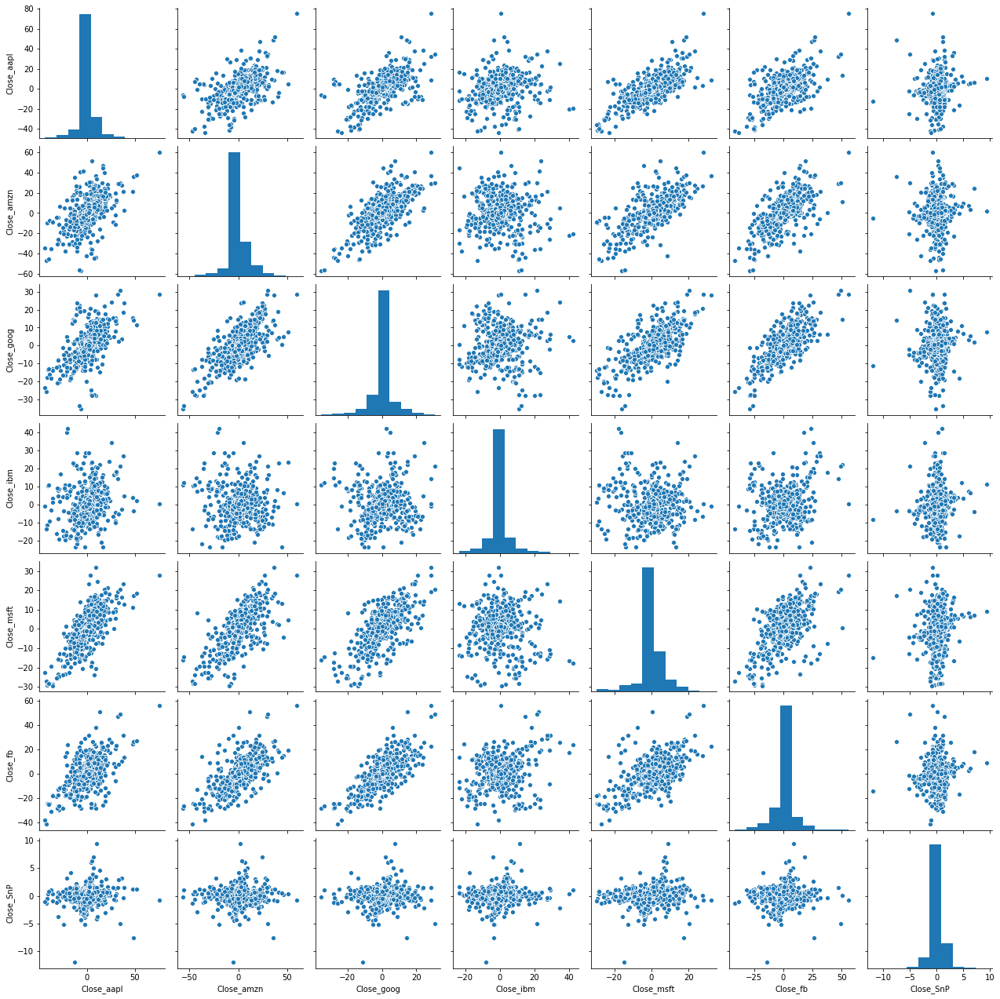

In [ ]:
sns.pairplot(stocks_daily_return_tech)
plt.show()

The S&P Prices and prices between the tech stocks are very much co-related in nature.

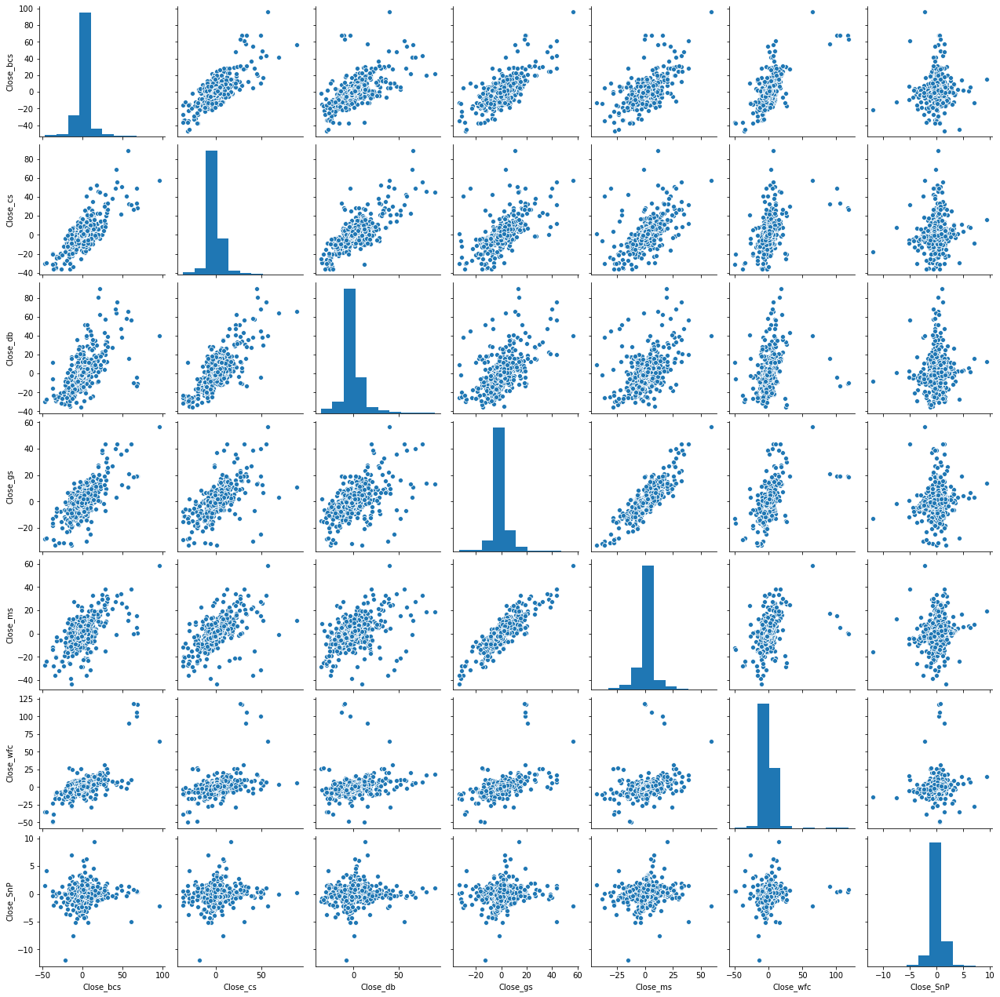

In [ ]:
sns.pairplot(stocks_daily_return_fin)
plt.show()

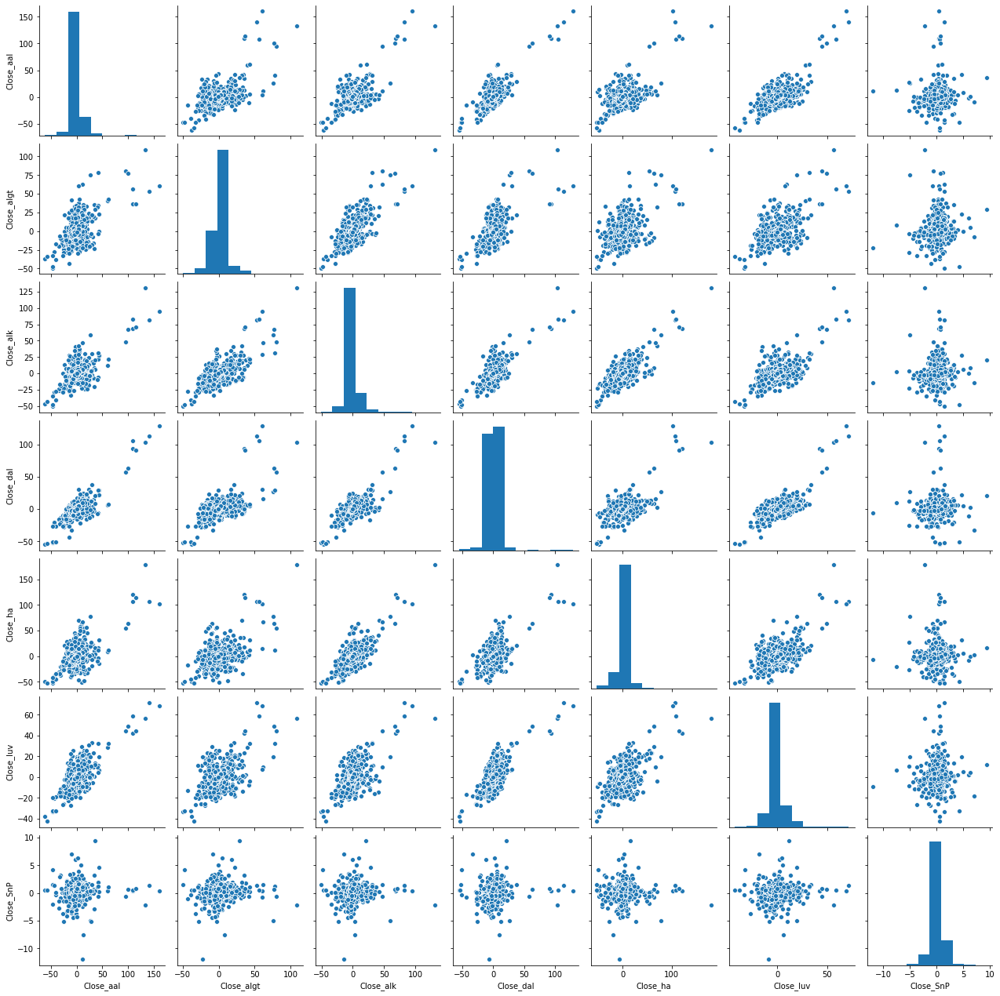

In [ ]:
sns.pairplot(stocks_daily_return_avn)
plt.show()

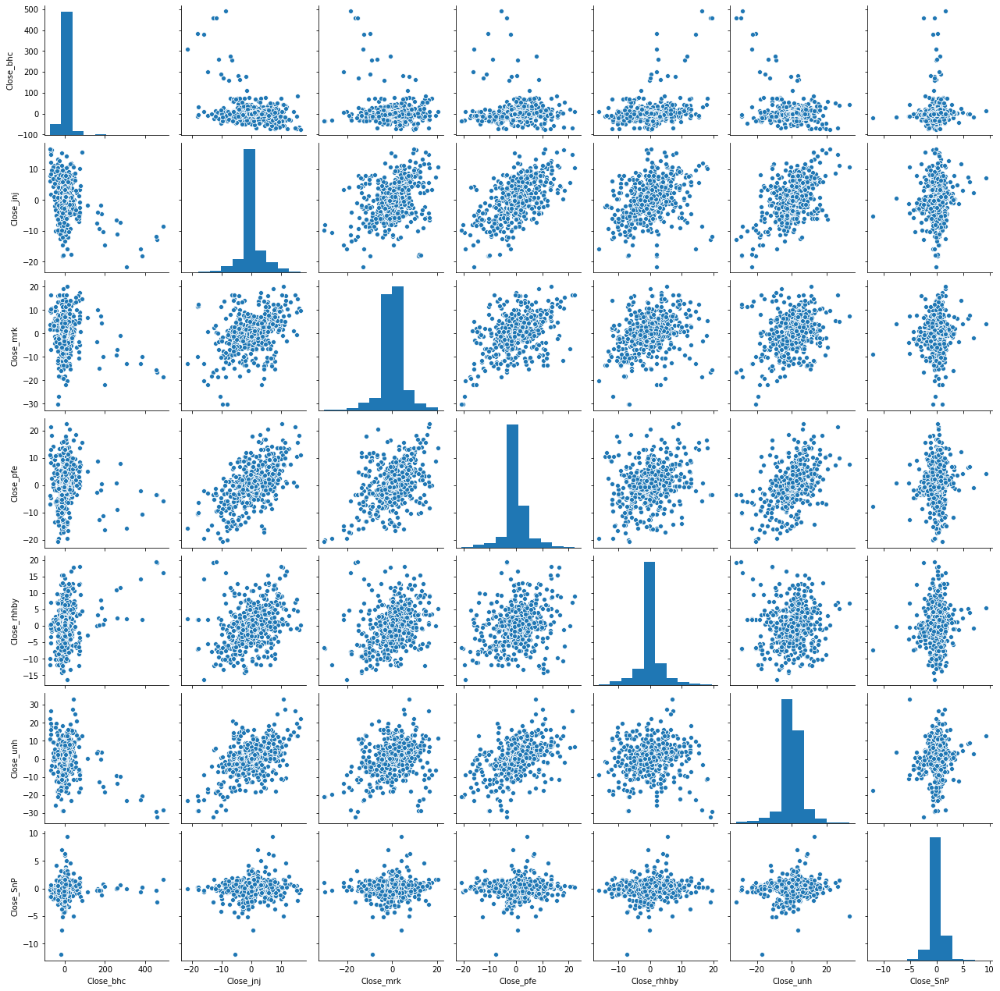

In [ ]:
sns.pairplot(stocks_daily_return_pharma)
plt.show()

In [ ]:
m1 = pd.merge(stocks_daily_return_tech,stocks_daily_return_fin.drop(columns = 'Close_SnP'), how="inner", on="Date")
m2 = pd.merge(m1, stocks_daily_return_avn.drop(columns = 'Close_SnP'), how="inner", on ="Date")
m3 = pd.merge(m2, stocks_daily_return_pharma.drop(columns = 'Close_SnP'), how="inner", on="Date")


In [ ]:
m3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1271 entries, 0 to 1270
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         1271 non-null   datetime64[ns]
 1   Close_aapl   1271 non-null   float64       
 2   Close_amzn   1271 non-null   float64       
 3   Close_goog   1271 non-null   float64       
 4   Close_ibm    1271 non-null   float64       
 5   Close_msft   1271 non-null   float64       
 6   Close_fb     1271 non-null   float64       
 7   Close_SnP    1271 non-null   float64       
 8   Close_bcs    1271 non-null   float64       
 9   Close_cs     1271 non-null   float64       
 10  Close_db     1271 non-null   float64       
 11  Close_gs     1271 non-null   float64       
 12  Close_ms     1271 non-null   float64       
 13  Close_wfc    1271 non-null   float64       
 14  Close_aal    1271 non-null   float64       
 15  Close_algt   1271 non-null   float64       
 16  Close_

Lets view all the merged colums along with their S&P prices of the resepctive stocks. 

In [ ]:
m3.head(10)

,Date,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_fb,Close_SnP,Close_bcs,Close_cs,...,Close_alk,Close_dal,Close_ha,Close_luv,Close_bhc,Close_jnj,Close_mrk,Close_pfe,Close_rhhby,Close_unh
0,2015-01-05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2015-01-06,1.233033,1.903663,-0.726907,-2.009561,-2.938759,1.645782,-0.889347,3.710806,0.851389,...,1.209790,-2.869036,2.546964,-11.150235,7.326696,-0.089879,1.486801,1.408448,2.663704,5.883396
2,2015-01-07,-3.018226,1.501439,-2.275317,-3.343512,-5.886087,8.245115,1.162984,2.652684,6.792023,...,-2.708417,-9.199545,-5.903901,-13.817700,-4.645720,-1.569372,-5.185188,-2.517367,-5.027030,2.936756
3,2015-01-09,-14.913112,13.523398,14.554259,-13.259172,-5.916763,0.368196,0.933414,-7.692302,-6.934962,...,16.329704,8.691333,-3.202077,11.465365,-1.835788,-6.479136,-8.802082,-6.915993,-5.036995,-8.712920
4,2015-01-12,8.930557,36.758365,28.312619,-0.981213,32.042088,22.801788,-0.809369,-8.268229,-14.015444,...,8.516036,8.910208,64.193108,29.372936,-55.911628,11.152140,3.883497,7.206626,0.779149,3.222947
5,2015-01-13,-6.067834,-56.595884,-35.489481,10.992355,-16.044911,-28.631446,-0.257856,-0.496806,3.816798,...,-24.343968,-2.223615,-33.650964,-13.945580,59.991896,2.344667,13.963714,-3.509816,3.508772,-11.345262
6,2015-01-14,-0.381052,-0.498745,0.945221,-0.644088,-0.862817,-0.222365,-0.581307,-1.497860,-1.340839,...,0.211694,-2.789101,-2.379975,-2.569172,-0.784605,-0.725470,0.723589,0.123308,1.091635,0.252258
7,2015-01-15,-2.714029,-2.155003,0.183680,-0.789471,-1.044384,-2.923435,-0.924788,-0.072411,1.797457,...,-0.113747,-0.573829,1.765439,-1.369161,-1.600772,-1.451925,-1.213279,-0.246299,2.898551,1.093581
8,2015-01-16,-0.777012,1.320780,1.253510,1.662672,1.671069,1.525992,1.342420,-1.231884,-5.038760,...,1.431588,1.753609,-0.454354,1.490997,1.711064,1.512346,1.858432,1.234559,0.828498,1.254067
9,2015-01-20,2.575719,-0.447131,-0.232245,-0.120913,0.324388,1.409947,0.154995,4.475422,-0.272104,...,3.608661,7.264394,2.572610,3.318138,-0.560753,-2.643214,-0.666346,0.914631,-0.520400,-0.141811


In [ ]:
col = m3.columns[1:]

In [ ]:
len(col)

25

## Correlation analysis


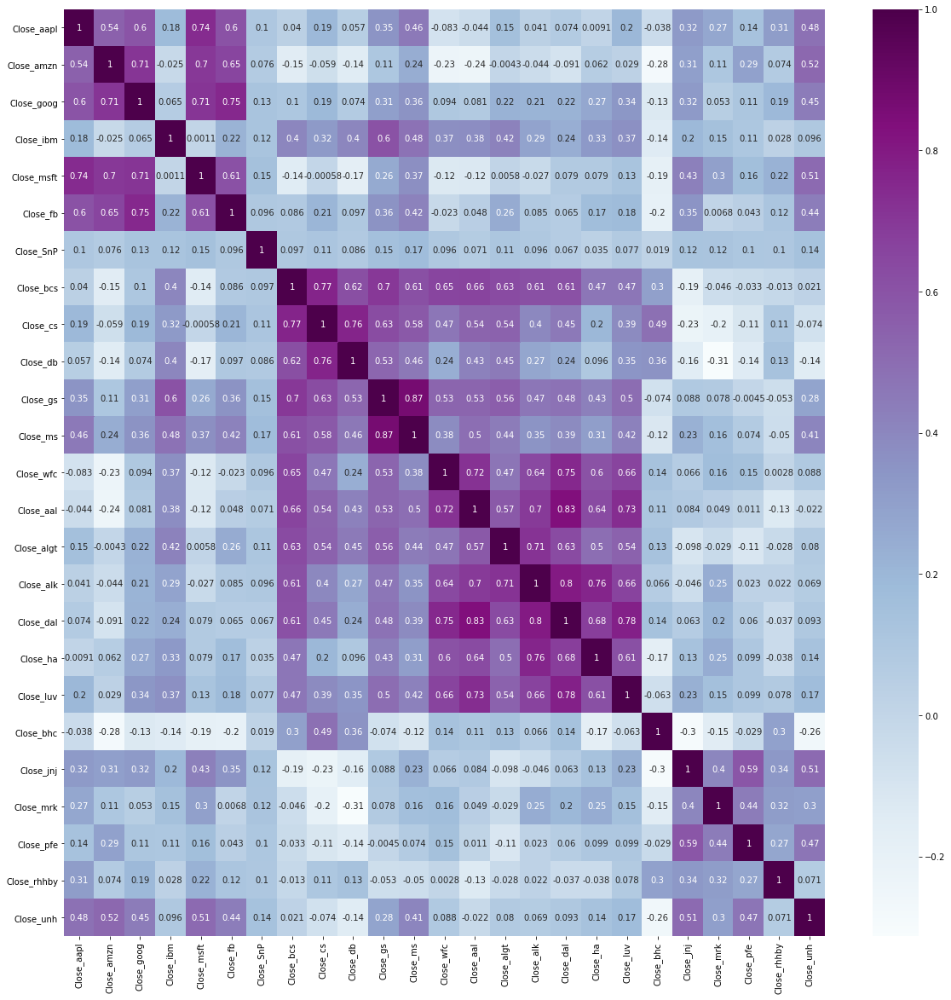

In [ ]:
plt.figure(figsize = [20,20])
sns.heatmap(np.corrcoef(m3.drop(columns='Date').T),annot = True,cmap = 'BuPu',xticklabels = col,yticklabels = col)
plt.show()

# Observation 1

1. As per correlation it is observed that the Technology and Aviation Industry are not well correlated
2. Finance Stocks and SnP have good correlations with other industry stocks. 
2. It is observed all the stocks that belong to the same industry are well correlated as per the given co-relation diagram. 
3. BHC is not very correlated with the rest of the stocks or within the industry itself 
4. We need to diversify the portfolio, by picking more stock from Tech and Aviation industry

In [ ]:
stocks_stat = m3.describe().T[['mean','std']]

In [ ]:
stocks_stat = stocks_stat.rename(columns = {'mean': 'Avg. daily return','std':'Risk'})

In [ ]:
stocks_stat.head()

,Avg. daily return,Risk
Close_aapl,0.489039,8.718043
Close_amzn,0.707326,10.130901
Close_goog,0.268521,6.091955
Close_ibm,0.148994,6.035611
Close_msft,0.333107,6.478334


In [ ]:
stocks_stat['Industry'] = 0
stocks_stat['Industry'][0:6] = 'tech'
stocks_stat['Industry'][6] = 'SnP'
stocks_stat['Industry'][7:13] = 'finance'
stocks_stat['Industry'][13:19]= 'aviation'
stocks_stat['Industry'][19:25]= 'pharma'


In [ ]:
stocks_stat

,Avg. daily return,Risk,Industry
Close_aapl,0.489039,8.718043,tech
Close_amzn,0.707326,10.130901,tech
Close_goog,0.268521,6.091955,tech
Close_ibm,0.148994,6.035611,tech
Close_msft,0.333107,6.478334,tech
Close_fb,0.437959,8.272214,tech
Close_SnP,0.046860,1.160399,SnP
Close_bcs,0.368079,9.959999,finance
Close_cs,0.350073,9.570982,finance
Close_db,0.463096,11.256307,finance


In [ ]:
stocks_stat.sort_values(by = 'Avg. daily return', ascending = False)

,Avg. daily return,Risk,Industry
Close_bhc,3.335672,37.923299,pharma
Close_ha,0.845348,14.482798,aviation
Close_amzn,0.707326,10.130901,tech
Close_aal,0.640743,13.602701,aviation
Close_algt,0.553402,11.262130,aviation
Close_aapl,0.489039,8.718043,tech
Close_alk,0.466100,10.738192,aviation
Close_db,0.463096,11.256307,finance
Close_dal,0.444563,10.525552,aviation
Close_fb,0.437959,8.272214,tech


In [ ]:
stocks_stat.sort_values(by = 'Risk')

,Avg. daily return,Risk,Industry
Close_SnP,0.046860,1.160399,SnP
Close_rhhby,0.088072,3.872923,pharma
Close_jnj,0.108998,3.924540,pharma
Close_pfe,0.110838,4.566864,pharma
Close_mrk,0.148215,4.875359,pharma
Close_unh,0.250794,5.754237,pharma
Close_ibm,0.148994,6.035611,tech
Close_goog,0.268521,6.091955,tech
Close_msft,0.333107,6.478334,tech
Close_gs,0.249437,7.137743,finance


# Observation 2
1. In the tech industry we see that AMZN is the best performing stock among all the other stocks. It is observed that the tech industry stocks have good average daily returns but they are slightly more volatile in nature
2. Profitability wise tech stock are superior to the others
3. Worst performing industry is Aviation due to the pandemic
4. it is seen that the Pharma Stocks and Finance Stocks do not yield high returns,these stocks may be avoided as they do not help in the diversification of the portfolio

In [ ]:
import warnings
import numpy as np
warnings.simplefilter(action='ignore', category=FutureWarning)
print('x' in np.arange(5))   #returns False, without Warning

False


## Recommendations: 

Since the most reliable stocks can be chosen from the tech and aviation industry. We can list out some options and analyze the portfolio performance. 

### Mr Patrick

#### Portfolio Option 1

For creating Mr. Patrick Portfolio. Lets choose some stocks. 

- `AMZN`
- `AAPL`
- `HA`
- `DAL`
- `UNH`

Reason- `AMZN` and `AAPL` both yield high retuns, `HA` and `DAL` are less correlated with the first two stocks chosen and hence is suitable for a diversified portfolio. It's observed that `UNH` is moderaltely corellated and do provide good returns.  

Creating the portfolio, with the basic assumption that returns for the last 5 returns will be repeated the next coming 5 years. Using technical analysis

In [ ]:
#Let us perform some additional merge operations. 

In [ ]:
n1 = pd.merge(tech_snp,fin_snp.drop(columns = 'Close_SnP'), how="inner", on= "Date")
n2 = pd.merge(n1, avn_snp.drop(columns = 'Close_SnP'), how="inner", on = "Date")
n3 = pd.merge(n2, pharma_snp.drop(columns = 'Close_SnP'), how="inner", on= "Date")


In [ ]:
n3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1271 entries, 0 to 1270
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         1271 non-null   datetime64[ns]
 1   Close_aapl   1271 non-null   float64       
 2   Close_amzn   1271 non-null   float64       
 3   Close_goog   1271 non-null   float64       
 4   Close_ibm    1271 non-null   float64       
 5   Close_msft   1271 non-null   float64       
 6   Close_fb     1271 non-null   float64       
 7   Close_SnP    1271 non-null   float64       
 8   Close_bcs    1271 non-null   float64       
 9   Close_cs     1271 non-null   float64       
 10  Close_db     1271 non-null   float64       
 11  Close_gs     1271 non-null   float64       
 12  Close_ms     1271 non-null   float64       
 13  Close_wfc    1271 non-null   float64       
 14  Close_aal    1271 non-null   float64       
 15  Close_algt   1271 non-null   float64       
 16  Close_

In [ ]:
n3.head()

,Date,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_fb,Close_SnP,Close_bcs,Close_cs,...,Close_alk,Close_dal,Close_ha,Close_luv,Close_bhc,Close_jnj,Close_mrk,Close_pfe,Close_rhhby,Close_unh
0,2015-01-05,32.237499,422.869995,537.900024,173.669998,48.660000,78.989998,2020.579956,15.630000,25.840000,...,65.300003,45.660000,23.950001,42.599998,223.020004,100.129997,59.860001,34.080002,36.040001,113.199997
1,2015-01-06,32.634998,430.920013,533.989990,170.179993,47.230000,80.290001,2002.609985,16.209999,26.059999,...,66.089996,44.349998,24.559999,37.849998,239.360001,100.040001,60.750000,34.560001,37.000000,119.860001
2,2015-01-07,31.650000,437.390015,521.840027,164.490005,44.450001,86.910004,2025.900024,16.639999,27.830000,...,64.300003,40.270000,23.110001,32.619999,228.240005,98.470001,57.599998,33.689999,35.139999,123.379997
3,2015-01-09,26.930000,496.540009,597.789978,142.679993,41.820000,87.230003,2044.810059,15.360000,25.900000,...,74.800003,43.770000,22.370001,36.360001,224.050003,92.089996,52.529999,31.360001,33.369999,112.629997
4,2015-01-12,29.334999,679.059998,767.039978,141.279999,55.220001,107.120003,2028.260010,14.090000,22.270000,...,81.169998,47.669998,36.730000,47.040001,98.779999,102.360001,54.570000,33.619999,33.630001,116.260002


In [ ]:
fin = n3.sort_values(by = 'Date')

In [ ]:
fin2 = fin.reset_index(drop = True)

In [ ]:
fin2

,Date,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_fb,Close_SnP,Close_bcs,Close_cs,...,Close_alk,Close_dal,Close_ha,Close_luv,Close_bhc,Close_jnj,Close_mrk,Close_pfe,Close_rhhby,Close_unh
0,2015-01-05,32.237499,422.869995,537.900024,173.669998,48.660000,78.989998,2020.579956,15.630000,25.840000,...,65.300003,45.660000,23.950001,42.599998,223.020004,100.129997,59.860001,34.080002,36.040001,113.199997
1,2015-01-06,32.634998,430.920013,533.989990,170.179993,47.230000,80.290001,2002.609985,16.209999,26.059999,...,66.089996,44.349998,24.559999,37.849998,239.360001,100.040001,60.750000,34.560001,37.000000,119.860001
2,2015-01-07,31.650000,437.390015,521.840027,164.490005,44.450001,86.910004,2025.900024,16.639999,27.830000,...,64.300003,40.270000,23.110001,32.619999,228.240005,98.470001,57.599998,33.689999,35.139999,123.379997
3,2015-01-09,26.930000,496.540009,597.789978,142.679993,41.820000,87.230003,2044.810059,15.360000,25.900000,...,74.800003,43.770000,22.370001,36.360001,224.050003,92.089996,52.529999,31.360001,33.369999,112.629997
4,2015-01-12,29.334999,679.059998,767.039978,141.279999,55.220001,107.120003,2028.260010,14.090000,22.270000,...,81.169998,47.669998,36.730000,47.040001,98.779999,102.360001,54.570000,33.619999,33.630001,116.260002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1266,2020-09-24,108.220001,3019.790039,1428.290039,118.089996,203.190002,249.529999,3246.590088,4.750000,9.620000,...,35.700001,29.010000,12.400000,36.860001,15.220000,144.669998,83.150002,35.759998,44.700001,292.660004
1267,2020-09-25,112.279999,3095.129883,1444.959961,118.949997,207.820007,254.820007,3298.459961,4.700000,9.480000,...,36.700001,29.780001,12.800000,37.099998,15.300000,145.660004,82.930000,36.049999,44.820000,302.500000
1268,2020-09-28,114.959999,3174.050049,1464.520020,121.730003,209.440002,256.820007,3351.600098,4.990000,9.900000,...,37.540001,31.340000,13.380000,38.240002,15.270000,147.110001,82.760002,36.389999,44.110001,303.230011
1269,2020-09-29,114.089996,3144.879883,1469.329956,120.940002,207.259995,261.790009,3335.469971,4.960000,9.830000,...,36.669998,30.610001,12.860000,37.610001,14.880000,147.059998,81.900002,36.169998,43.369999,304.149994


Stocks Chosen - AMZN, AAPL, DAL, HA, UNH

In [ ]:
port1 = fin2[['Date','Close_amzn','Close_aapl','Close_dal','Close_ha','Close_unh']]

In [ ]:
port1 = portfolio1.sort_values(by = 'Date')

In [ ]:
port1

,Date,Close_amzn,Close_aapl,Close_dal,Close_ha,Close_unh
0,2015-01-05,422.869995,32.237499,45.660000,23.950001,113.199997
1,2015-01-06,430.920013,32.634998,44.349998,24.559999,119.860001
2,2015-01-07,437.390015,31.650000,40.270000,23.110001,123.379997
3,2015-01-09,496.540009,26.930000,43.770000,22.370001,112.629997
4,2015-01-12,679.059998,29.334999,47.669998,36.730000,116.260002
...,...,...,...,...,...,...
1266,2020-09-24,3019.790039,108.220001,29.010000,12.400000,292.660004
1267,2020-09-25,3095.129883,112.279999,29.780001,12.800000,302.500000
1268,2020-09-28,3174.050049,114.959999,31.340000,13.380000,303.230011
1269,2020-09-29,3144.879883,114.089996,30.610001,12.860000,304.149994


In [ ]:
portfolio_1 = portfolio1.reset_index(drop = True)

In [ ]:
portfolio_1

,Date,Close_amzn,Close_aapl,Close_dal,Close_ha,Close_unh
0,2015-01-05,422.869995,32.237499,45.660000,23.950001,113.199997
1,2015-01-06,430.920013,32.634998,44.349998,24.559999,119.860001
2,2015-01-07,437.390015,31.650000,40.270000,23.110001,123.379997
3,2015-01-09,496.540009,26.930000,43.770000,22.370001,112.629997
4,2015-01-12,679.059998,29.334999,47.669998,36.730000,116.260002
...,...,...,...,...,...,...
1266,2020-09-24,3019.790039,108.220001,29.010000,12.400000,292.660004
1267,2020-09-25,3095.129883,112.279999,29.780001,12.800000,302.500000
1268,2020-09-28,3174.050049,114.959999,31.340000,13.380000,303.230011
1269,2020-09-29,3144.879883,114.089996,30.610001,12.860000,304.149994


In [ ]:
def normalize(df):
  x = df.copy()

  # For Looping through each stock (while ignoring the date column with index 0)
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

In [ ]:
def portfolio_allocation(df, weights):
 
   df_portfolio = df.copy()
  
    # Normalize the stock avalues 
   df_portfolio = normalize(df_portfolio)
  
   for counter, stock in enumerate(df_portfolio.columns[1:]):
      df_portfolio[stock] = df_portfolio[stock] * weights[counter]
      df_portfolio[stock] = df_portfolio[stock] * 500000

   df_portfolio['Portfolio Daily Value in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
  
   df_portfolio['portfolio daily % return'] = 0.0000

   for i in range(1, len(df)):
    
    # Calculating the percentage of change from previous day
      df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['Portfolio Daily Value in $'][i] - df_portfolio['Portfolio Daily Value in $'][i-1]) / df_portfolio['Portfolio Daily Value in $'][i-1]) * 100 
  
  # setting the value of first row to zero, as the previous value is not available
   df_portfolio['portfolio daily % return'][0] = 0
   return df_portfolio

In [ ]:
weights = np.array([0.2,0.2,0.2,0.2,0.2])

In [ ]:
weights

array([0.2, 0.2, 0.2, 0.2, 0.2])

In [ ]:
portfolio_aln = portfolio_allocation(port1,weights).copy()

In [ ]:
portfolio_aln

,Date,Close_amzn,Close_aapl,Close_dal,Close_ha,Close_unh,Portfolio Daily Value in $,portfolio daily % return
0,2015-01-05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,5.000000e+05,0.000000
1,2015-01-06,101903.662614,101233.032997,97130.963644,102546.964403,105883.395916,5.086980e+05,1.739604
2,2015-01-07,103433.684152,98177.591258,88195.356986,96492.693257,108992.933101,4.952923e+05,-2.635308
3,2015-01-09,117421.433271,83536.256953,95860.709593,93402.923031,99496.466418,4.897178e+05,-1.125491
4,2015-01-12,160583.632329,90996.509996,104402.098117,153361.162699,102703.184701,6.120466e+05,24.979448
...,...,...,...,...,...,...,...,...
1266,2020-09-24,714117.831652,335696.019719,63534.822602,51774.528110,258533.579290,1.423657e+06,0.399727
1267,2020-09-25,731934.145150,348290.042599,65221.202365,53444.674178,267226.155492,1.466116e+06,2.982421
1268,2020-09-28,750597.130686,356603.342586,68637.757337,55866.385976,267871.041551,1.499576e+06,2.282182
1269,2020-09-29,743698.990277,353904.612762,67038.985983,53695.196088,268683.747403,1.487022e+06,-0.837179


###### Looking at the last portfolio and comparing it with the first

In [ ]:
# Cummulative return of the portfolio 
cummulative_return = ((portfolio_aln['Portfolio Daily Value in $'][-1:] - portfolio_aln['Portfolio Daily Value in $'][0])/ portfolio_aln['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 200.01168174165164 %


In [ ]:
# Let us calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portfolio_aln['portfolio daily % return'].std()))

Standard deviation of the portfolio is 6.201079192999206


In [ ]:
#Let us calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portfolio_aln['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.2818676857734689 %


In [ ]:
# Portfolio sharpe ratio, by assuming a risk-free rate of 0.75% for better calculation. 
rf = 0.0075
sharpe_ratio = ((portaln['portfolio daily % return'].mean() - rf) / portfolio_aln['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of portfolio {}'.format(sharpe_ratio))

Sharpe ratio of portfolio 0.4385357612676653


- The returns are beyond the expectations for the investor (we need 100% return and we're receiving 200%) 
- Sharpe Ratio is nearly 1, which indicates good rate of returns for the risk.

#### For creating Mr. Patrick Portfolio option 2
Portfolio Option 2: Lets choose some stocks. 


- `MSFT`
- `AMZN`
- `GOOG`
- `LUV`
- `UNH`

Let's choose new stocks
-`MSFT` , `UNH` , `GOOG`,`AMZN`, `LUV`

In [ ]:
port2 = fin2[['Date','Close_amzn','Close_goog','Close_msft','Close_luv','Close_unh']]

In [ ]:
port2 = portfolio2.sort_values(by = 'Date')

In [ ]:
port2

,Date,Close_amzn,Close_goog,Close_msft,Close_luv,Close_unh
0,2015-01-05,422.869995,537.900024,48.660000,42.599998,113.199997
1,2015-01-06,430.920013,533.989990,47.230000,37.849998,119.860001
2,2015-01-07,437.390015,521.840027,44.450001,32.619999,123.379997
3,2015-01-09,496.540009,597.789978,41.820000,36.360001,112.629997
4,2015-01-12,679.059998,767.039978,55.220001,47.040001,116.260002
...,...,...,...,...,...,...
1266,2020-09-24,3019.790039,1428.290039,203.190002,36.860001,292.660004
1267,2020-09-25,3095.129883,1444.959961,207.820007,37.099998,302.500000
1268,2020-09-28,3174.050049,1464.520020,209.440002,38.240002,303.230011
1269,2020-09-29,3144.879883,1469.329956,207.259995,37.610001,304.149994


In [ ]:
portfolio_2 = port2.reset_index(drop = True)

In [ ]:
portaln = portfolio_allocation(port2,weights).copy()

In [ ]:
portfolio_aln

,Date,Close_amzn,Close_aapl,Close_dal,Close_ha,Close_unh,Portfolio Daily Value in $,portfolio daily % return
0,2015-01-05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,5.000000e+05,0.000000
1,2015-01-06,101903.662614,101233.032997,97130.963644,102546.964403,105883.395916,5.086980e+05,1.739604
2,2015-01-07,103433.684152,98177.591258,88195.356986,96492.693257,108992.933101,4.952923e+05,-2.635308
3,2015-01-09,117421.433271,83536.256953,95860.709593,93402.923031,99496.466418,4.897178e+05,-1.125491
4,2015-01-12,160583.632329,90996.509996,104402.098117,153361.162699,102703.184701,6.120466e+05,24.979448
...,...,...,...,...,...,...,...,...
1266,2020-09-24,714117.831652,335696.019719,63534.822602,51774.528110,258533.579290,1.423657e+06,0.399727
1267,2020-09-25,731934.145150,348290.042599,65221.202365,53444.674178,267226.155492,1.466116e+06,2.982421
1268,2020-09-28,750597.130686,356603.342586,68637.757337,55866.385976,267871.041551,1.499576e+06,2.282182
1269,2020-09-29,743698.990277,353904.612762,67038.985983,53695.196088,268683.747403,1.487022e+06,-0.837179


In [ ]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portfolio_aln['Portfolio Daily Value in $'][-1:] - portfolio_aln['Portfolio Daily Value in $'][0])/ portfolio_aln['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 200.01168174165164 %


In [ ]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portfolio_aln['portfolio daily % return'].std()))

Standard deviation of the portfolio is 6.201079192999206


In [ ]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portfolio_aln['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.2818676857734689 %


In [ ]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portfolio_aln['portfolio daily % return'].mean() - rf) / portfolio_aln['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 0.7023699989206112


Here we can see that the 
- returns have increased to 248%, 
- the risk is lower
- Sharpe Ratio has also stayed quite the same at 0.73 which is close to to 1. 
Thus this portfolio can be recommended to Patrick.

In [ ]:
#Let's try even further to reduce Risk.
#We choose the top 4 low-risk stocks along with 1 high value stock
port3 = fin2[['Date','Close_SnP','Close_amzn','Close_jnj','Close_rhhby','Close_pfe']]


- `SnP`
- `AMZN`
- `RHHBY`
- `JNJ`
- `PFE`

In [ ]:
portfolio3 = port3.sort_values(by = 'Date')

In [ ]:
portfolio3

,Date,Close_SnP,Close_amzn,Close_jnj,Close_rhhby,Close_pfe
0,2015-01-05,2020.579956,422.869995,100.129997,36.040001,34.080002
1,2015-01-06,2002.609985,430.920013,100.040001,37.000000,34.560001
2,2015-01-07,2025.900024,437.390015,98.470001,35.139999,33.689999
3,2015-01-09,2044.810059,496.540009,92.089996,33.369999,31.360001
4,2015-01-12,2028.260010,679.059998,102.360001,33.630001,33.619999
...,...,...,...,...,...,...
1266,2020-09-24,3246.590088,3019.790039,144.669998,44.700001,35.759998
1267,2020-09-25,3298.459961,3095.129883,145.660004,44.820000,36.049999
1268,2020-09-28,3351.600098,3174.050049,147.110001,44.110001,36.389999
1269,2020-09-29,3335.469971,3144.879883,147.059998,43.369999,36.169998


In [ ]:
portfolio3 = port3.reset_index(drop = True)

In [ ]:
portfolio_aln = portfolio_allocation(port3,weights).copy()

In [ ]:
portfolio_aln

,Date,Close_SnP,Close_amzn,Close_jnj,Close_rhhby,Close_pfe,Portfolio Daily Value in $,portfolio daily % return
0,2015-01-05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,5.000000e+05,0.000000
1,2015-01-06,99110.652813,101903.662614,99910.120840,102663.704144,101408.447687,5.049966e+05,0.999318
2,2015-01-07,100263.294109,103433.684152,98342.159143,97502.769215,98855.625067,4.983975e+05,-1.306753
3,2015-01-09,101199.165761,117421.433271,91970.437191,92591.559584,92018.776877,4.952014e+05,-0.641287
4,2015-01-12,100380.091566,160583.632329,102227.108825,93312.985757,98650.226018,5.551540e+05,12.106726
...,...,...,...,...,...,...,...,...
1266,2020-09-24,160676.150348,714117.831652,144482.175506,124028.856159,104929.565438,1.248235e+06,0.343509
1267,2020-09-25,163243.228817,731934.145150,145470.896199,124361.816749,105780.507290,1.270791e+06,1.807033
1268,2020-09-28,165873.173593,750597.130686,146919.010694,122391.786282,106778.159813,1.292559e+06,1.713002
1269,2020-09-29,165074.881649,743698.990277,146869.072612,120338.506650,106132.617011,1.282114e+06,-0.808102


In [ ]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portfolio_aln['Portfolio Daily Value in $'][-1:] - portfolio_aln['Portfolio Daily Value in $'][0])/ portfolio_aln['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of portfolio is 157.24120232909866 %


In [ ]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portfolio_aln['portfolio daily % return'].std()))

Standard deviation of the portfolio is 4.508559920468895


In [ ]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portfolio_aln['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.178805782041974 %


In [ ]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portfolio_aln['portfolio daily % return'].mean() - rf) / portfolio_aln['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 0.6031626578227148


Here our 
- profits are excedding the expected profits by 57% 
- reduced the risk significantly to 1.6%. 
- For a conservative investment with less risk, this ideal for Mr Patrick

## Recommendations for Peter

In [ ]:
#As Mr Peter is having a Capital Allocation for 1 Million instead of 500K we will change it to 1 mil

def portfolio_allocation2(df, weights):

    df_portfolio = df.copy()
  
  # Normalize the stock avalues 
    df_portfolio = normalize(df_portfolio)
  
    for counter, stock in enumerate(df_portfolio.columns[1:]):
        df_portfolio[stock] = df_portfolio[stock] * weights[counter]
        df_portfolio[stock] = df_portfolio[stock] * 1000000

        df_portfolio['Portfolio Daily Value in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
  
        df_portfolio['portfolio daily % return'] = 0.0000

        for i in range(1, len(df)):
    
# Calculate the percentage of change from the previous day
            df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['Portfolio Daily Value in $'][i] - df_portfolio['Portfolio Daily Value in $'][i-1]) / df_portfolio['Portfolio Daily Value in $'][i-1]) * 100 
  
  # set the value of first row to zero, as previous value is not available
    df_portfolio['portfolio daily % return'][0] = 0
    return df_portfolio

In [ ]:
#For Peter we will need to focus on high returns with a high Sharpe Ratio, even though its very risky.
#For easier calculation let us only choose the stocks with highest return.

Stocks Choosen - `AMZN` , `FB` , `AAPL` , `MSFT` , `HA`


- `MSFT`
- `AMZN`
- `FB`
- `HA`
- `AAPL`

In [ ]:
port4 = fin2[['Date','Close_amzn','Close_fb','Close_aapl','Close_msft','Close_ha']]

In [ ]:
port4 = portfolio4.sort_values(by = 'Date')

In [ ]:
port4

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_ha
0,2015-01-05,422.869995,78.989998,32.237499,48.660000,23.950001
1,2015-01-06,430.920013,80.290001,32.634998,47.230000,24.559999
2,2015-01-07,437.390015,86.910004,31.650000,44.450001,23.110001
3,2015-01-09,496.540009,87.230003,26.930000,41.820000,22.370001
4,2015-01-12,679.059998,107.120003,29.334999,55.220001,36.730000
...,...,...,...,...,...,...
1266,2020-09-24,3019.790039,249.529999,108.220001,203.190002,12.400000
1267,2020-09-25,3095.129883,254.820007,112.279999,207.820007,12.800000
1268,2020-09-28,3174.050049,256.820007,114.959999,209.440002,13.380000
1269,2020-09-29,3144.879883,261.790009,114.089996,207.259995,12.860000


In [ ]:
portfolio4 = port4.reset_index(drop = True)

In [ ]:
portfolio_aln2 = portfolio_allocation2(port4,weights).copy()

In [ ]:
portfolio_aln2

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_ha,Portfolio Daily Value in $,portfolio daily % return
0,2015-01-05,2.000000e+05,200000.000000,200000.000000,200000.000000,200000.000000,3.000010e+06,0.000000
1,2015-01-06,2.038073e+05,203291.563572,202466.065994,194122.482532,205093.928806,3.032957e+06,1.098218
2,2015-01-07,2.068674e+05,220053.186987,196355.182516,182696.263872,192985.386514,3.062013e+06,0.958016
3,2015-01-09,2.348429e+05,220863.413619,167072.513907,171886.559803,186805.846062,3.089503e+06,0.897770
4,2015-01-12,3.211673e+05,271224.220059,181993.019992,226962.601726,306722.325398,3.997498e+06,29.389679
...,...,...,...,...,...,...,...,...
1266,2020-09-24,1.428236e+06,631801.507325,671392.039438,835141.808467,103549.056219,1.345642e+07,0.678869
1267,2020-09-25,1.463868e+06,645195.628439,696580.085198,854171.833128,106889.348355,1.380513e+07,2.591419
1268,2020-09-28,1.501194e+06,650259.560710,713206.685171,860830.258940,111732.771953,1.408006e+07,1.991469
1269,2020-09-29,1.487398e+06,662843.437469,707809.225523,851870.098644,107390.392176,1.402295e+07,-0.405625


In [ ]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portfolio_aln2['Portfolio Daily Value in $'][-1:] - portfolio_aln2['Portfolio Daily Value in $'][0])/ portfolio_aln2['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 369.68731416516374 %


In [ ]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portfolio_aln2['portfolio daily % return'].std()))

Standard deviation of the portfolio is 7.509369284924005


In [ ]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portfolio_aln2['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.4151549887607178 %


In [ ]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portaln2['portfolio daily % return'].mean() - rf) / portfolio_aln2['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 0.8607691531107842


All the metrics look good, 
- the returns at 300% 
- the Sharpe Ratio also at a good 0.86

##Let's optimise even further. Let's pick the pharma stock UNH instead of HA to slightly reduce the risk


- `MSFT`
- `AMZN`
- `GOOG`
- `AAPL`
- `UNH`

In [ ]:
portfolio5 = fin2[['Date','Close_amzn','Close_fb','Close_aapl','Close_msft','Close_unh']]

In [ ]:
portfolio5 = portfolio5.sort_values(by = 'Date')

In [ ]:
portfolio5

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_unh
0,2015-01-05,422.869995,78.989998,32.237499,48.660000,113.199997
1,2015-01-06,430.920013,80.290001,32.634998,47.230000,119.860001
2,2015-01-07,437.390015,86.910004,31.650000,44.450001,123.379997
3,2015-01-09,496.540009,87.230003,26.930000,41.820000,112.629997
4,2015-01-12,679.059998,107.120003,29.334999,55.220001,116.260002
...,...,...,...,...,...,...
1266,2020-09-24,3019.790039,249.529999,108.220001,203.190002,292.660004
1267,2020-09-25,3095.129883,254.820007,112.279999,207.820007,302.500000
1268,2020-09-28,3174.050049,256.820007,114.959999,209.440002,303.230011
1269,2020-09-29,3144.879883,261.790009,114.089996,207.259995,304.149994


In [ ]:
port5 = portfolio5.reset_index(drop = True)

In [ ]:
portaln2 = portfolio_allocation2(port5,weights).copy()

In [ ]:
portaln2

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_unh,Portfolio Daily Value in $,portfolio daily % return
0,2015-01-05,2.000000e+05,200000.000000,200000.000000,200000.000000,200000.000000,3.000010e+06,0.000000
1,2015-01-06,2.038073e+05,203291.563572,202466.065994,194122.482532,211766.791831,3.039630e+06,1.320651
2,2015-01-07,2.068674e+05,220053.186987,196355.182516,182696.263872,217985.866201,3.087014e+06,1.558881
3,2015-01-09,2.348429e+05,220863.413619,167072.513907,171886.559803,198992.932836,3.101690e+06,0.475417
4,2015-01-12,3.211673e+05,271224.220059,181993.019992,226962.601726,205406.369401,3.896180e+06,25.614733
...,...,...,...,...,...,...,...,...
1266,2020-09-24,1.428236e+06,631801.507325,671392.039438,835141.808467,517067.158580,1.386995e+07,0.690228
1267,2020-09-25,1.463868e+06,645195.628439,696580.085198,854171.833128,534452.310984,1.423270e+07,2.615421
1268,2020-09-28,1.501194e+06,650259.560710,713206.685171,860830.258940,535742.083103,1.450408e+07,1.906674
1269,2020-09-29,1.487398e+06,662843.437469,707809.225523,851870.098644,537367.494807,1.445293e+07,-0.352620


In [ ]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portaln2['Portfolio Daily Value in $'][-1:] - portaln2['Portfolio Daily Value in $'][0])/ portaln2['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 384.4605427068072 %


In [ ]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portaln2['portfolio daily % return'].std()))

Standard deviation of the portfolio is 7.464880357932975


In [ ]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portaln2['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.41468323328098877 %


In [ ]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portaln2['portfolio daily % return'].mean() - rf) / portaln2['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 0.8658991343258455


All our metrics have become better
- Returns have increased to 310%
- Risk has decreased to 1.50
- Sharpe Ratio has increased to 1.22`m

This is a good portfolio and can be recommended to Mr Peter`